# Ejercicio 4
4- Realice una registración basada en características, otra con CCN y otra con MI de la imágenes
contenidas en “PAIByB-7”, evaluando los resultados con las métricas de la GUIA I ¿Qué
conclusiones puede sacar al respecto? Comparar los resultados entre sí.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

from registration import Imagen, Registracion

%load_ext autoreload
%autoreload 2

Antes de comenzar, se aclara que se utilizaran las versiones denoiseadas de las imágenes, ya que se obtienen mejores resultados en la registración.

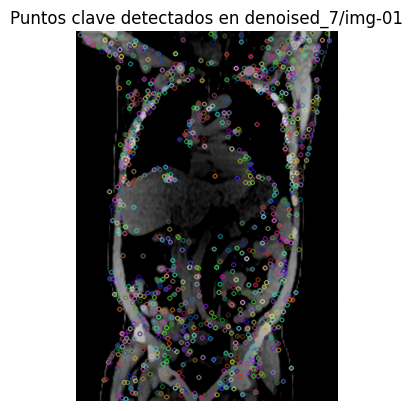

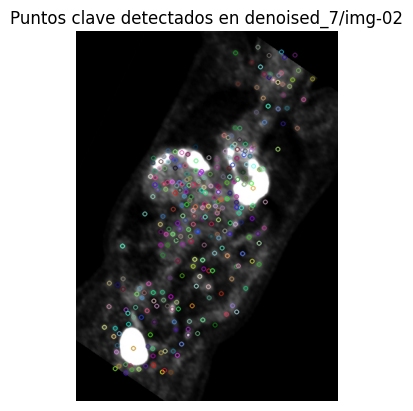

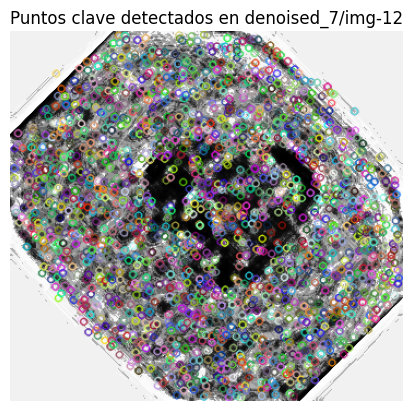

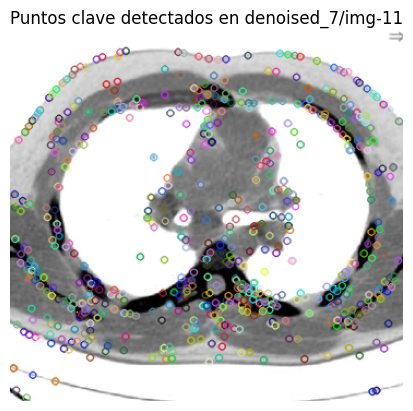

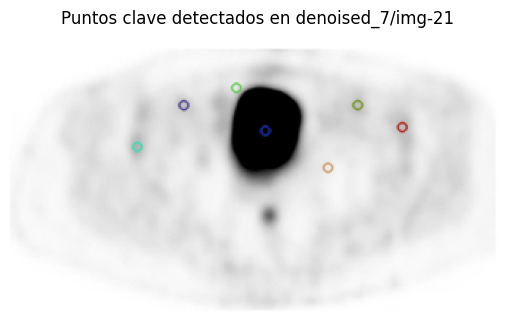

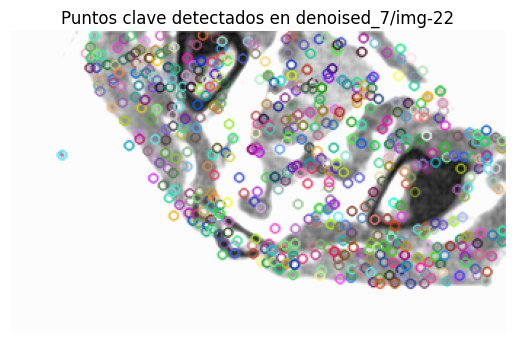

In [13]:
base_dir = 'denoised_7'
reg_pairs = {f"{base_dir}/img-{i}{i%2+1}.tif": f"{base_dir}/img-{i}{(i+1)%2+1}.tif" for i in range(3)}
img_pairs = []

for img1, img2 in reg_pairs.items():
    im1 = Imagen(img1, feature_extractor='sift')
    im1.mostrar_puntos_clave()
    im2 = Imagen(img2, feature_extractor='sift')
    # Invertimos la imagen y recalculamos los puntos clave
    im2.imagen = 255 - im2.imagen
    im2.extraer_puntos_clave()
    im2.mostrar_puntos_clave()
    img_pairs.append((im1, im2))

# Registración basada en características por SIFT

Matches encontrados: 365


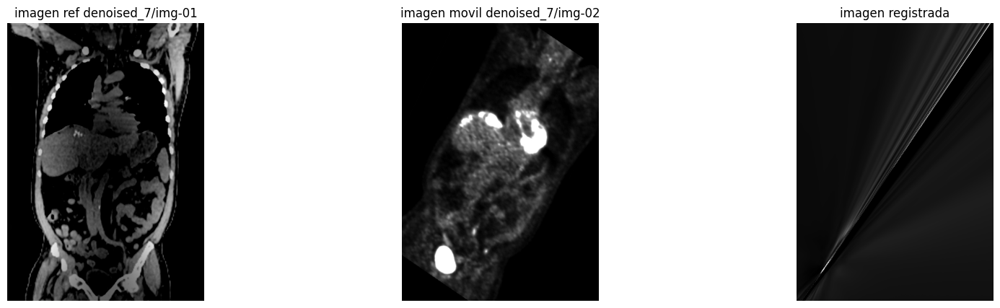

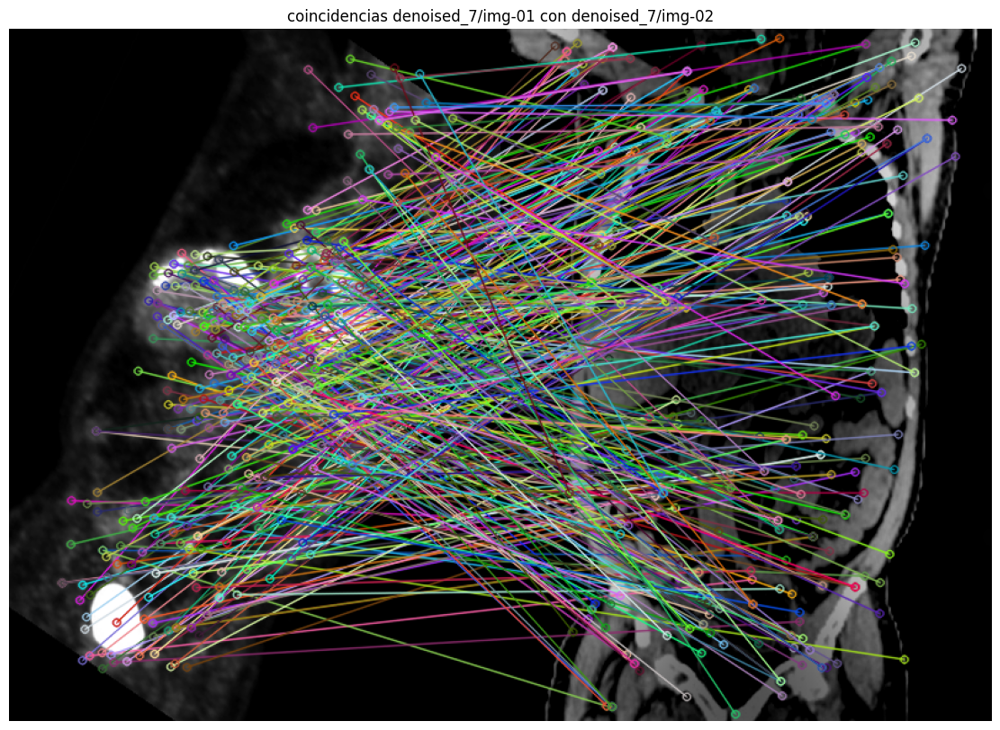

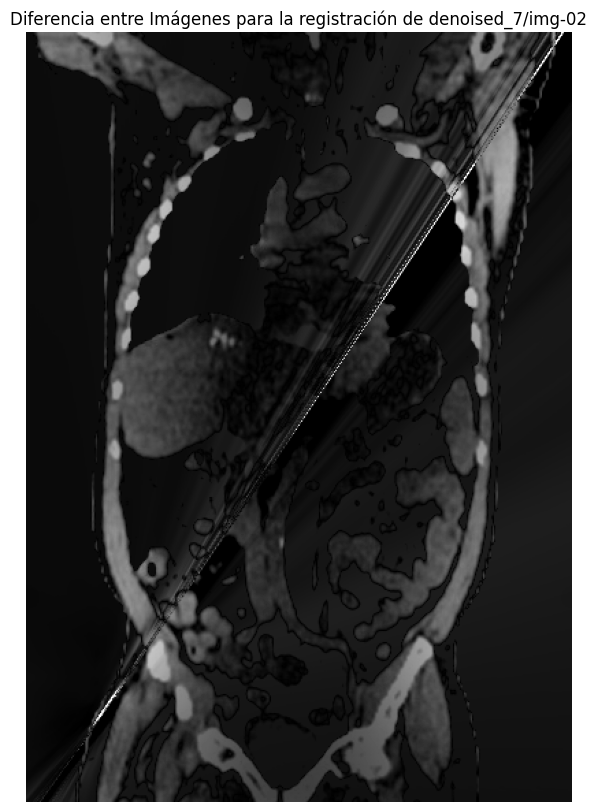

SSIM: 0.1319
MSE: 106.4035
PSNR: 64.1529
SSIM: 0.1319
MSE: 106.4035
PSNR: 64.1529
Matches encontrados: 615


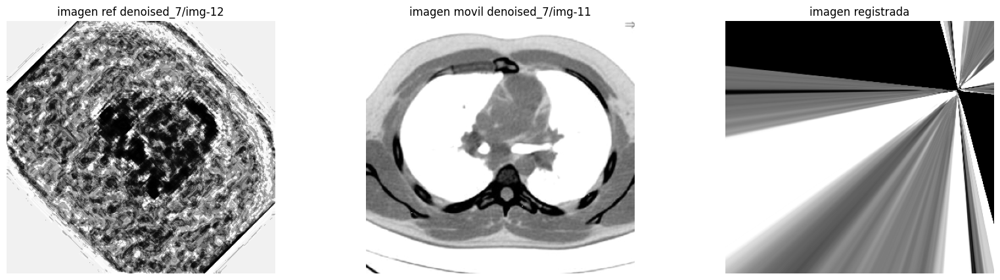

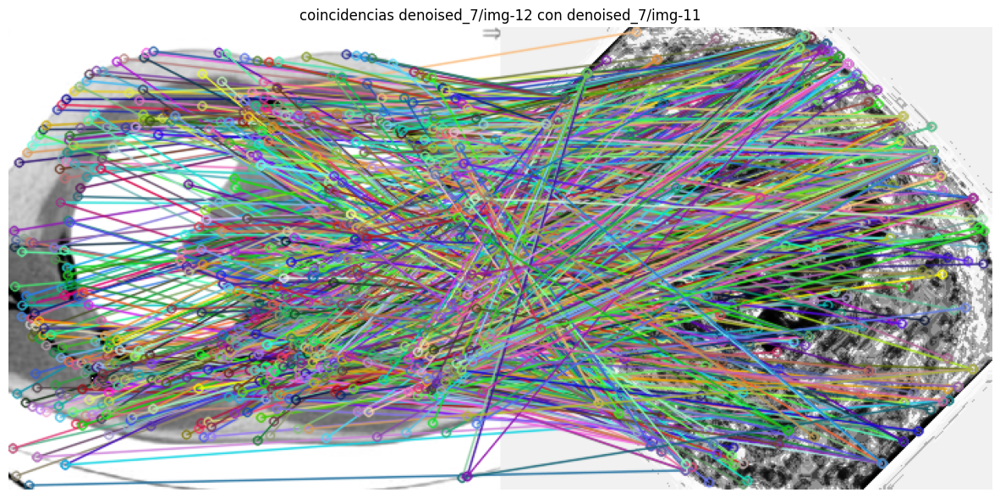

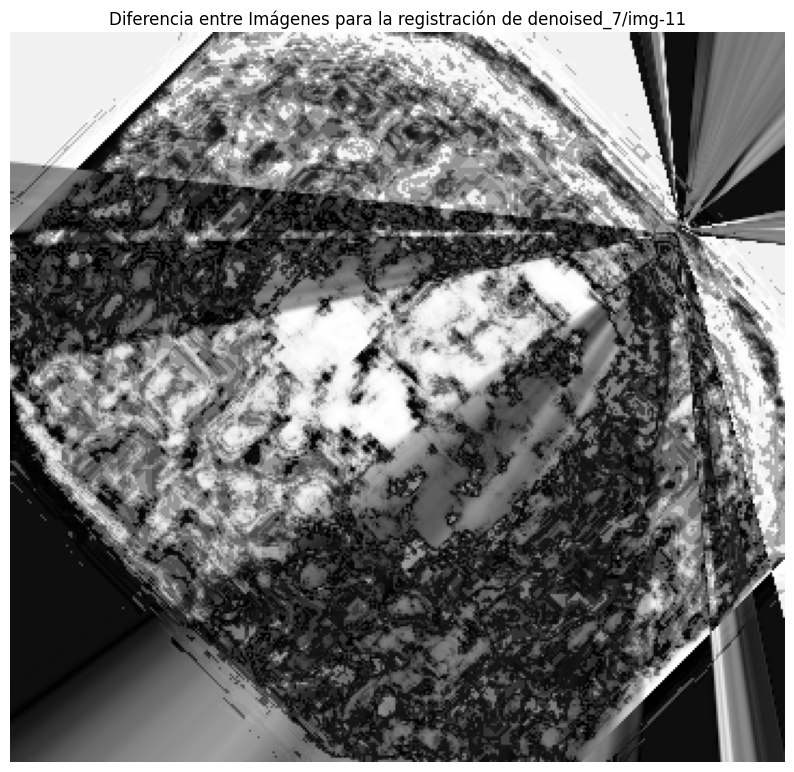

SSIM: 0.0913
MSE: 110.9164
PSNR: 63.7375
SSIM: 0.0913
MSE: 110.9164
PSNR: 63.7375
Matches encontrados: 584


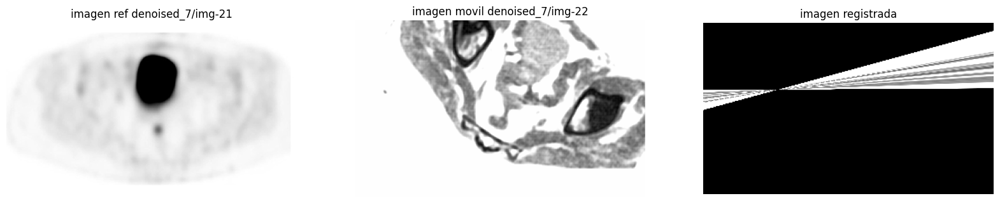

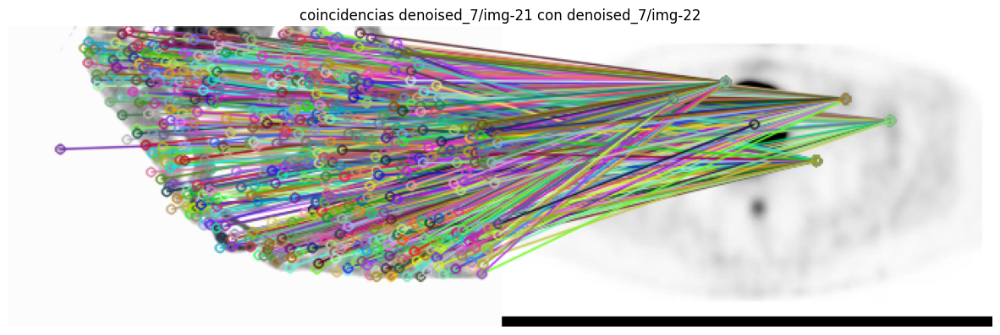

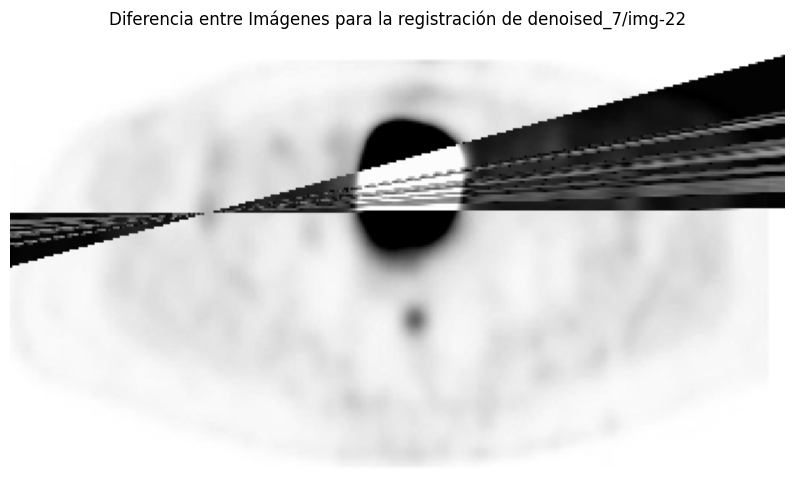

SSIM: 0.0282
MSE: 79.0986
PSNR: 67.1183
SSIM: 0.0282
MSE: 79.0986
PSNR: 67.1183


In [3]:
# Registración basada en características
for im1, im2 in img_pairs:
    reg = Registracion(im1, im2, modo='features', min_match_count=4, lowe_threshold=1, ransac_thres=5)
    reg.ejecutar_registracion(plot=True)
    reg.calcular_metricas()

## Registración basada en CCN


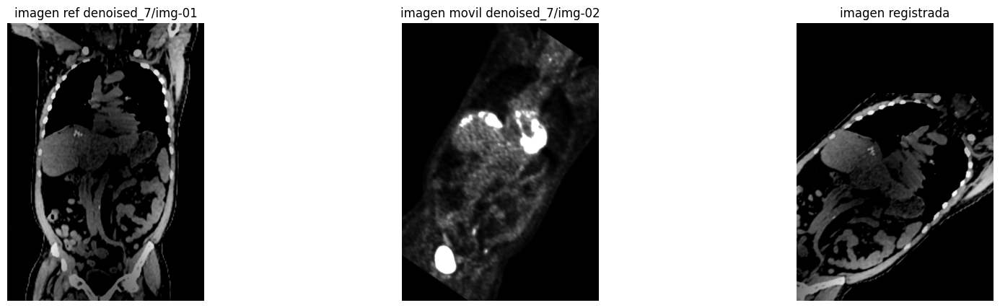

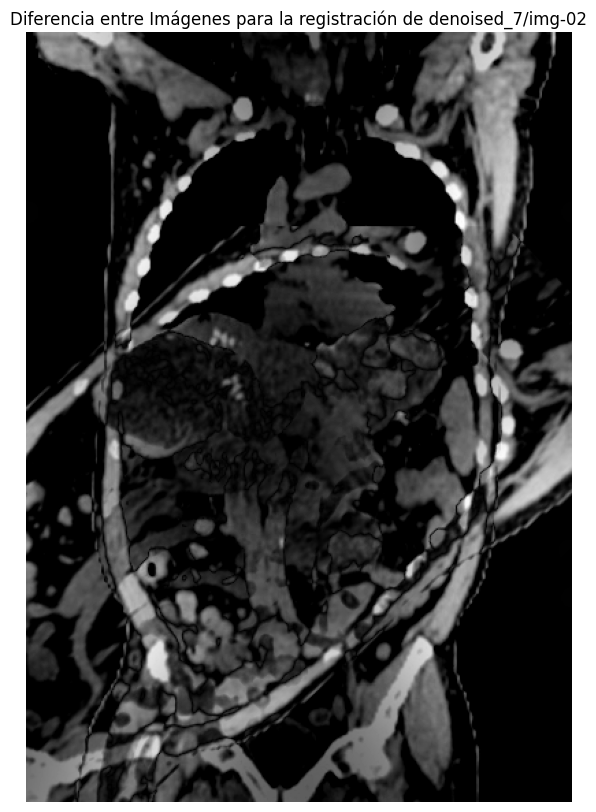

SSIM: 0.3160
MSE: 62.3046
PSNR: 69.5049


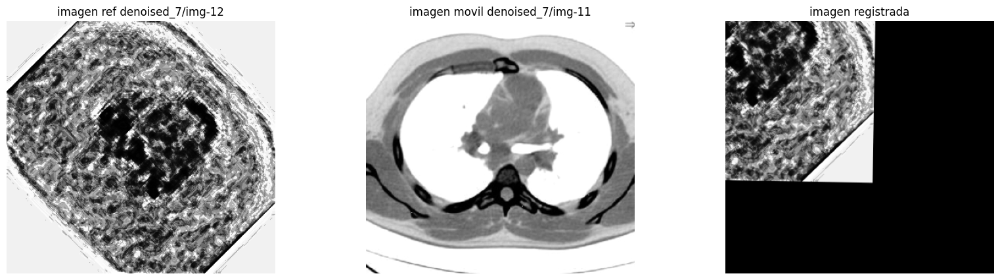

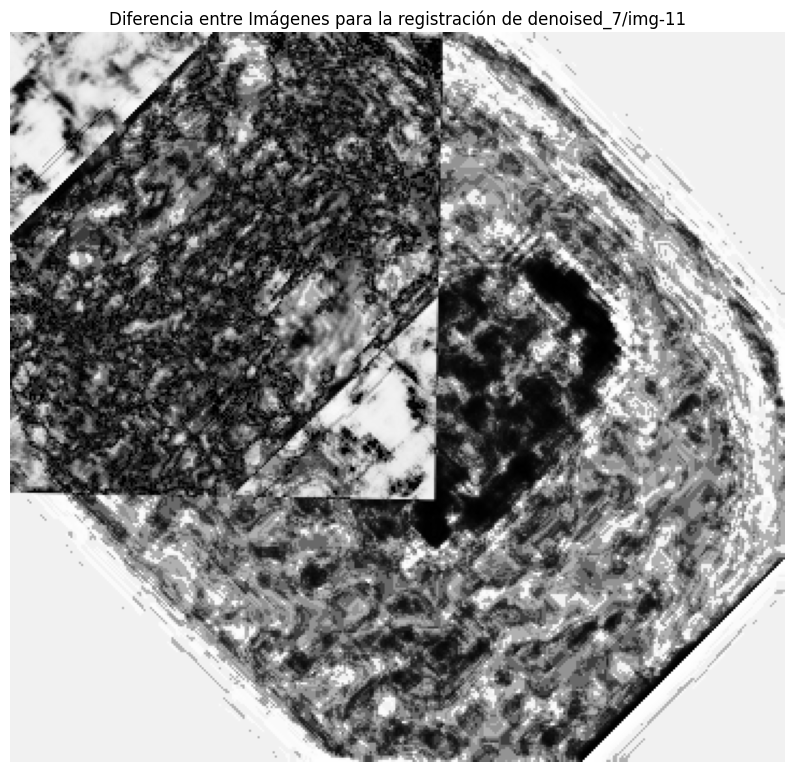

SSIM: 0.0070
MSE: 108.9602
PSNR: 63.9154


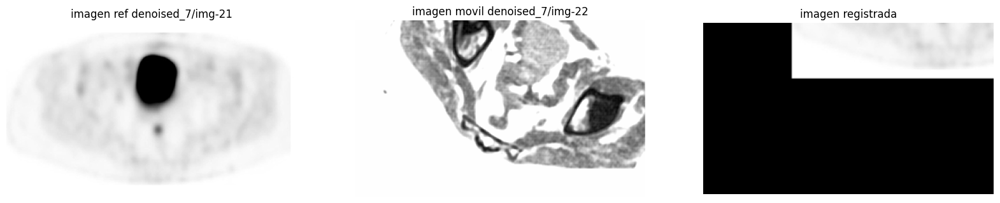

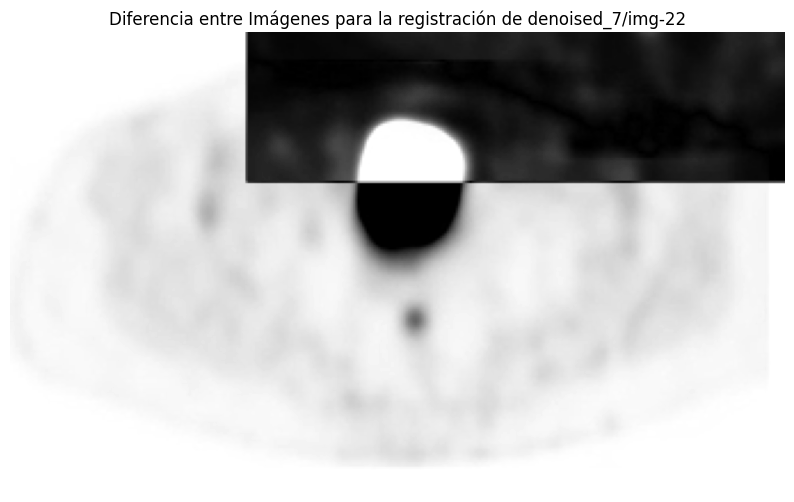

SSIM: 0.1494
MSE: 83.2648
PSNR: 66.6050


In [4]:
for im1, im2 in img_pairs:
    reg = Registracion(im1, im2, modo='intensidad')
    reg.registracion_CCN()
    reg.plot_registracion()
    reg.calcular_metricas()

## Registración basada en MI

Información Mutua inicial: 0.142078
differential_evolution step 1: f(x)= -0.19326130159382135
differential_evolution step 2: f(x)= -0.19326130159382135
differential_evolution step 3: f(x)= -0.19515559099204366
differential_evolution step 4: f(x)= -0.19515559099204366
differential_evolution step 5: f(x)= -0.19836587203315623
differential_evolution step 6: f(x)= -0.2139961023854135
differential_evolution step 7: f(x)= -0.2139961023854135
differential_evolution step 8: f(x)= -0.2139961023854135
differential_evolution step 9: f(x)= -0.2139961023854135
differential_evolution step 10: f(x)= -0.21566257482506873
differential_evolution step 11: f(x)= -0.21566257482506873
differential_evolution step 12: f(x)= -0.21566257482506873
differential_evolution step 13: f(x)= -0.21841660751295425
differential_evolution step 14: f(x)= -0.21928766538269354
differential_evolution step 15: f(x)= -0.21928766538269354
differential_evolution step 16: f(x)= -0.21928766538269354
differential_evolution step 17: f

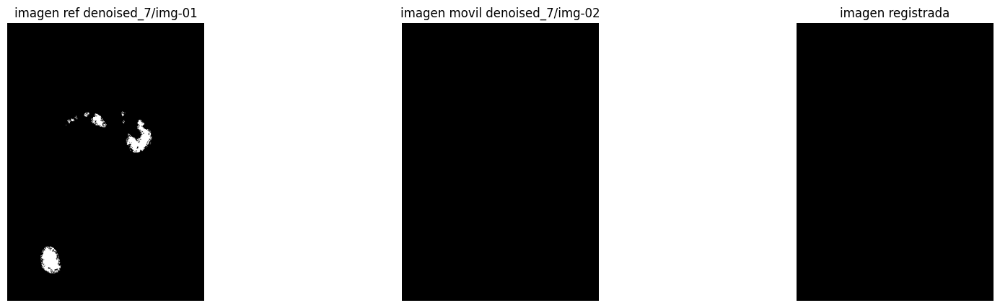

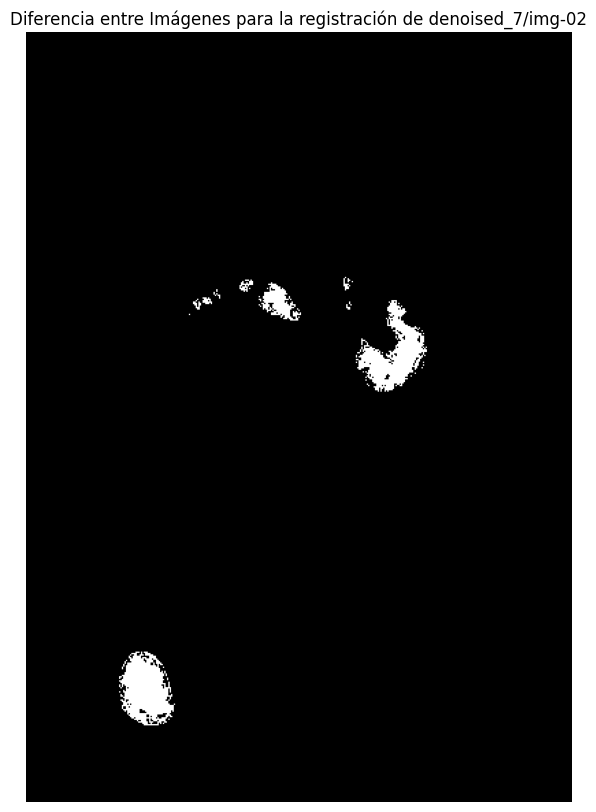

SSIM: 0.9983
MSE: 0.0151
PSNR: 152.7500
Información Mutua inicial: 0.066196
differential_evolution step 1: f(x)= -0.3217575780743893
differential_evolution step 2: f(x)= -0.3217575780743893
differential_evolution step 3: f(x)= -0.3442807655089081
differential_evolution step 4: f(x)= -0.3442807655089081
differential_evolution step 5: f(x)= -0.3442807655089081
differential_evolution step 6: f(x)= -0.3442807655089081
differential_evolution step 7: f(x)= -0.35987689979535453
differential_evolution step 8: f(x)= -0.35987689979535453
differential_evolution step 9: f(x)= -0.35987689979535453
differential_evolution step 10: f(x)= -0.35987689979535453
differential_evolution step 11: f(x)= -0.35987689979535453
differential_evolution step 12: f(x)= -0.35987689979535453
differential_evolution step 13: f(x)= -0.35987689979535453
differential_evolution step 14: f(x)= -0.35987689979535453
differential_evolution step 15: f(x)= -0.35987689979535453
differential_evolution step 16: f(x)= -0.3605265031535

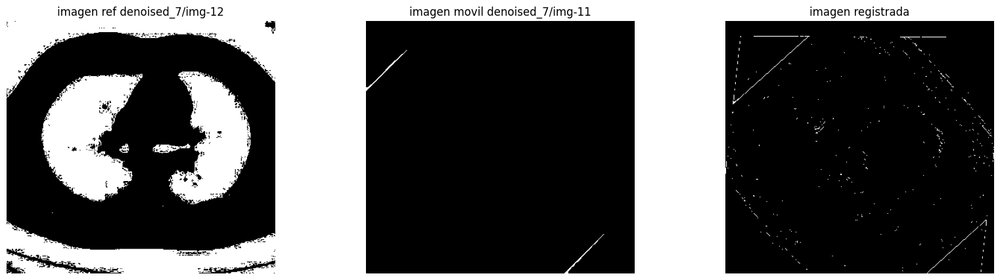

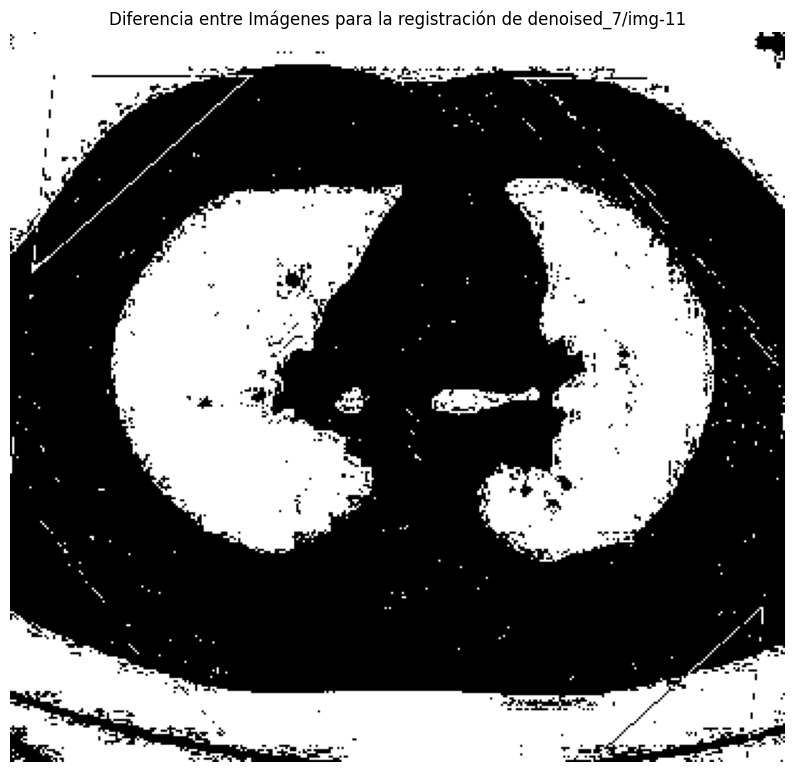

SSIM: 0.9516
MSE: 0.4011
PSNR: 119.9597
Información Mutua inicial: 0.216942
differential_evolution step 1: f(x)= -0.4143581049401134
differential_evolution step 2: f(x)= -0.418632164598995
differential_evolution step 3: f(x)= -0.4383982770351091
differential_evolution step 4: f(x)= -0.4383982770351091
differential_evolution step 5: f(x)= -0.4383982770351091
differential_evolution step 6: f(x)= -0.4383982770351091
differential_evolution step 7: f(x)= -0.453690996745193
differential_evolution step 8: f(x)= -0.4571469330142842
differential_evolution step 9: f(x)= -0.4588789274517482
differential_evolution step 10: f(x)= -0.4758810008665135
differential_evolution step 11: f(x)= -0.4758810008665135
differential_evolution step 12: f(x)= -0.4758810008665135
differential_evolution step 13: f(x)= -0.4758810008665135
differential_evolution step 14: f(x)= -0.4758810008665135
differential_evolution step 15: f(x)= -0.48742133437827095
differential_evolution step 16: f(x)= -0.48742133437827095
diffe

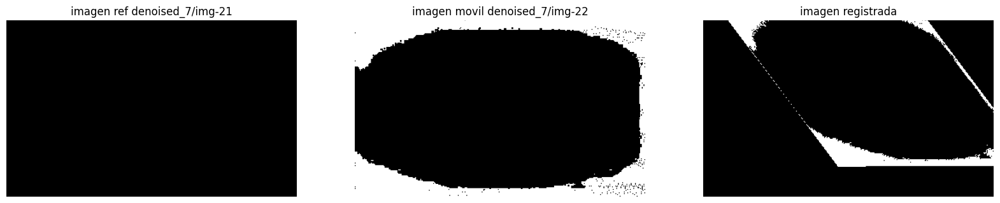

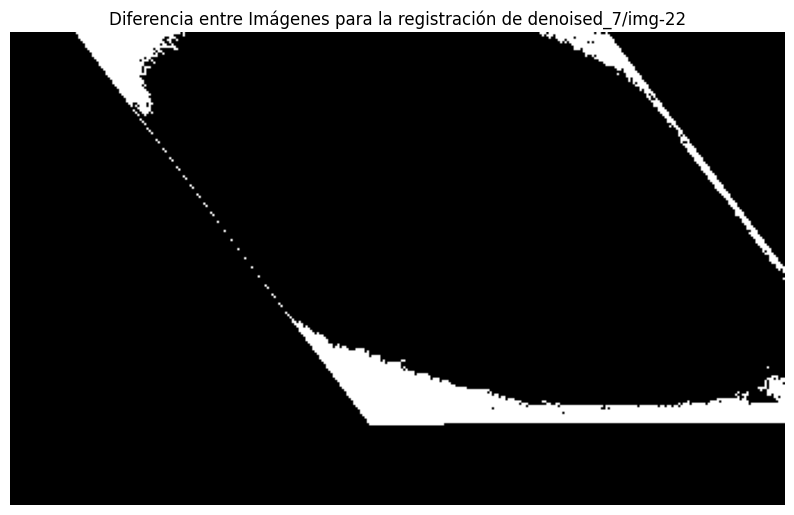

SSIM: 0.9935
MSE: 0.0609
PSNR: 138.8071


In [14]:
for im1, im2 in img_pairs:
    reg = Registracion(im1, im2, modo='intensidad')
    reg.registracion_IM()
    reg.plot_registracion()
    reg.calcular_metricas()

## Conclusiones

A pesar de mis mayores intentos, no hubo manera de registrar adecuadamente ninguna imagen con ninguno de los métodos sugeridos. Particularmente, la información mutua ni siquiera logró ejecutarse adecuadamente sin binarizar las imágenes. Evidentemente, el trabajo previo de reducción de ruido no fue suficiente.